In [1]:
import sys
 
sys.path.append("D:/Zoo/Gull/geoVeRoPy_Private")

import geoVeRoPy
import geoVeRoPyPri

## Solve Close-enough TSP with different Approaches

### 1. Neighborhoods on Euclidean space

#### 1.1 Disk-shape neighborhoods

First, randomly create some nodes, each has a disk-shape neighborhood.

In [2]:
N = 10
nodes = geoVeRoPy.rndNodes(nodeIDs = [i for i in range(1, N)])
nodes = geoVeRoPy.rndNodeNeighbors(
    nodes = nodes,
    shape = 'RndCircle',
    minRadius = 5,
    maxRadius = 10
)

D:\Zoo\Gull\geoVeRoPy\demo\../../geoVeRoPy\geoVeRoPy\instance.py:84: UserWarning: WARNING: Set sampled area to be default as a (0, 100) x (0, 100) square
  warnings.warn("WARNING: Set sampled area to be default as a (0, 100) x (0, 100) square")


Second, set the depot to be the center of the map

In [3]:
depotLoc = (50, 50)

Third, plot the map

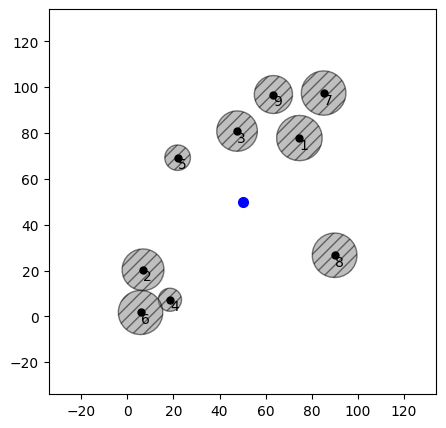

In [4]:
fig, ax = geoVeRoPy.plotNodes(
    nodes = nodes,
    nodeColor = 'black',
    nodeMarkerSize = 5,
    boundingBox = [-20, 120, -20, 120])
fig, ax = geoVeRoPy.plotLocs(
    fig = fig,
    ax = ax,
    locs = [depotLoc],
    locColor = 'blue',
    locMarkerSize = 7)

##### 1.1.1 Exact method - Generalized Benders Decomposition

In [5]:
cetsp = geoVeRoPyPri.solveCETSP(
    startLoc = depotLoc,
    endLoc = depotLoc,
    nodes = nodes,
    neighbor = "Circle",
    algo = "Exact",
    method = "GBD",
    cutSetting = ['degenCut', 'paretoCut'])



[0, 2, 1, 3, 5, 6, 9, 4, 8, 7, 10]
---------------------------------------------------------------------------
Residual: 27.8159293143595
Add default cut: - theta >= 0.046 * e[0, 2] + 2.519 * e[2, 1] + 2.563 * e[1, 3] + 1.194 * e[3, 5] + 3.487 * e[5, 6] + 1.218 * e[6, 9] + 4.403 * e[9, 4] + 6.074 * e[4, 8] + 4.418 * e[8, 7] + 1.894 * e[7, 10]
Time Pass: 0.01[s]
Cut: subtour - 0, gbc - 1, degen - 0
So far Best Dist: inf
CurrSol Dist: 290.71254705395023
CurrObj: 262.89661773959074
CurrBound: -1e+100


[0, 6, 2, 7, 8, 4, 9, 3, 5, 1, 10]
---------------------------------------------------------------------------
Residual: 61.339764400532076
Add Pareto cut: - theta >= 0.454 * e[0, 6] + 16.926 * e[6, 2] + 3.585 * e[2, 7] + 3.624 * e[7, 8] + 5.242 * e[8, 4] + 4.233 * e[4, 9] + 15.519 * e[9, 3] + 3.179 * e[3, 5] + 5.676 * e[5, 1] + 2.903 * e[1, 10]
Time Pass: 0.02[s]
Cut: subtour - 10, gbc - 2, degen - 0
So far Best Dist: 290.71254705395023
CurrSol Dist: 214.98969675020717
CurrObj: 153.64993

Residual: 57.888679195462636
Add Pareto cut: - theta >= 5.432 * e[0, 9] + 7.426 * e[9, 3] + 2.51 * e[3, 5] + 6.801 * e[5, 1] + 5.312 * e[1, 6] + 12.329 * e[6, 8] + 2.674 * e[8, 7] + 4.108 * e[7, 2] + 8.793 * e[2, 4] + 2.504 * e[4, 10]
Time Pass: 0.22[s]
Cut: subtour - 27, gbc - 25, degen - 0
So far Best Dist: 214.71369754448145
CurrSol Dist: 226.87716855295992
CurrObj: 202.47041955139827
CurrBound: 194.0255028454126


[0, 1, 5, 3, 9, 8, 2, 7, 6, 4, 10]
---------------------------------------------------------------------------
Residual: 43.82289165690066
Add Pareto cut: - theta >= 2.904 * e[0, 1] + 5.651 * e[1, 5] + 3.627 * e[5, 3] + 9.801 * e[3, 9] + 5.356 * e[9, 8] + 3.905 * e[8, 2] + 3.454 * e[2, 7] + 0.859 * e[7, 6] + 6.114 * e[6, 4] + 2.152 * e[4, 10]
Time Pass: 0.23[s]
Cut: subtour - 27, gbc - 26, degen - 0
So far Best Dist: 214.71369754448145
CurrSol Dist: 215.359236629443
CurrObj: 208.10108609114783
CurrBound: 194.0255028454126


[0, 1, 5, 3, 9, 6, 8, 2, 7, 4, 10]
-------------

Residual: 60.81761874958341
Add Pareto cut: - theta >= 1.34 * e[0, 4] + 3.723 * e[4, 9] + 14.352 * e[9, 3] + 2.7 * e[3, 5] + 6.777 * e[5, 1] + 9.696 * e[1, 2] + 6.303 * e[2, 8] + 3.474 * e[8, 7] + 4.471 * e[7, 6] + 7.981 * e[6, 10]
Time Pass: 0.43[s]
Cut: subtour - 35, gbc - 45, degen - 3
So far Best Dist: 214.71369754448145
CurrSol Dist: 228.9969529935905
CurrObj: 211.11061026098815
CurrBound: 199.48527710980184


[0, 1, 5, 3, 9, 6, 4, 2, 8, 7, 10]
---------------------------------------------------------------------------
Same length as: [0, 1, 5, 3, 9, 4, 6, 2, 8, 7, 10] - 216.3740768053134
Degenerated repSeq: - remove a group


[0, 4, 6, 8, 7, 2, 9, 3, 5, 1, 10]
---------------------------------------------------------------------------
Residual: 51.56498455579897
Add Pareto cut: - theta >= 3.997 * e[0, 4] + 0.0 * e[4, 6] + 6.947 * e[6, 8] + 2.919 * e[8, 7] + 4.736 * e[7, 2] + 5.657 * e[2, 9] + 15.779 * e[9, 3] + 2.936 * e[3, 5] + 5.696 * e[5, 1] + 2.898 * e[1, 10]
Time Pass: 0.44[

Residual: 62.01407456510434
Add Pareto cut: - theta >= 3.773 * e[0, 4] + 7.776 * e[4, 2] + 4.41 * e[2, 8] + 2.808 * e[8, 7] + 2.454 * e[7, 6] + 13.566 * e[6, 9] + 15.716 * e[9, 3] + 2.915 * e[3, 5] + 5.696 * e[5, 1] + 2.899 * e[1, 10]
Time Pass: 0.64[s]
Cut: subtour - 35, gbc - 65, degen - 6
So far Best Dist: 214.71369754448145
CurrSol Dist: 222.69219748925403
CurrObj: 208.0630759199058
CurrBound: 203.52163168925813


[0, 8, 2, 7, 6, 4, 9, 3, 5, 1, 10]
---------------------------------------------------------------------------
Residual: 49.473600952806365
Add Pareto cut: - theta >= 0.618 * e[0, 8] + 3.141 * e[8, 2] + 3.1 * e[2, 7] + 1.373 * e[7, 6] + 13.748 * e[6, 4] + 0.389 * e[4, 9] + 15.623 * e[9, 3] + 2.885 * e[3, 5] + 5.696 * e[5, 1] + 2.901 * e[1, 10]
Time Pass: 0.65[s]
Cut: subtour - 35, gbc - 66, degen - 6
So far Best Dist: 214.71369754448145
CurrSol Dist: 224.21659290095562
CurrObj: 213.2390126544967
CurrBound: 203.92567959997953


[0, 4, 6, 7, 2, 8, 9, 3, 5, 1, 10]
----------

In [6]:
cetsp

{'ofv': 214.71367882731175,
 'dist': 214.71369754448145,
 'seq': [0, 1, 5, 3, 9, 8, 7, 2, 6, 4, 10],
 'path': [(50, 50),
  (42.75416079361096, 62.261410843144674),
  (20.14565489213155, 65.33527535872594),
  (15.642789917589319, 30.576564828576238),
  (38.25747289042038, 27.91519117887875),
  (86.08635010588188, 22.28360964925124),
  (92.93977984903614, 47.69229976982092),
  (78.84658965914545, 43.92720462492786),
  (60.847143822632646, 44.498416740625956),
  (56.571994188225894, 44.63195839183847),
  (50, 50)],
 'gap': 0,
 'solType': 'IP_Optimal',
 'lowerBound': 214.71367882731175,
 'upperBound': 214.71367882731175,
 'runtime': 0.8418865203857422,
 'convergence': [(290.71254705395023, 262.89661773959074, -1e+100, 0.01),
  (214.98969675020717, 153.64993234967508, 153.64993234967508, 0.02),
  (214.98969692321216, 153.64993234967508, 153.64993234967508, 0.03),
  (336.5615988964757, 321.17079712335146, 169.74119365258713, 0.03),
  (220.35061893340972, 174.95238143841755, 169.7411936525871

In [7]:
fig, ax = geoVeRoPy.plotLocSeq(
    fig = fig,
    ax = ax,
    lineColor = 'red',
    locSeq = cetsp['path'])

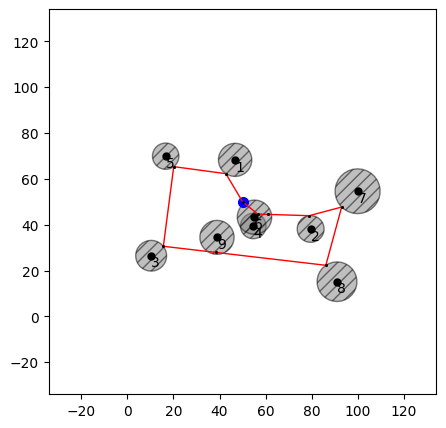

In [8]:
fig

In [9]:
N = 10
nodes = geoVeRoPy.rndNodes(nodeIDs = [i for i in range(1, N)])
nodes = geoVeRoPy.rndNodeNeighbors(
    nodes = nodes,
    shape = 'RndConvexPoly',
    maxNumSide = 8,
    maxDiag = 20,
    minDiag = 15
)

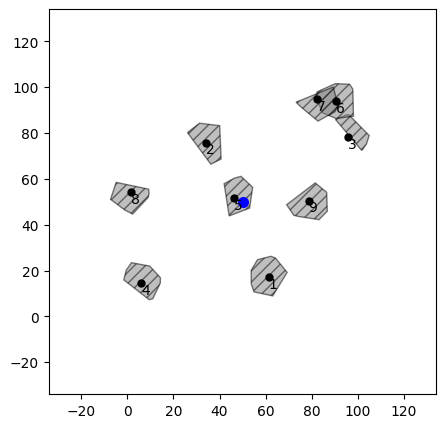

In [10]:
fig, ax = geoVeRoPy.plotNodes(
    nodes = nodes,
    nodeColor = 'black',
    nodeMarkerSize = 5,
    boundingBox = [-20, 120, -20, 120])
fig, ax = geoVeRoPy.plotLocs(
    fig = fig,
    ax = ax,
    locs = [depotLoc],
    locColor = 'blue',
    locMarkerSize = 7)

In [11]:
cetsp = geoVeRoPyPri.solveCETSP(
    startLoc = depotLoc,
    endLoc = depotLoc,
    nodes = nodes,
    neighbor = "Poly",
    algo = "Exact",
    method = "GBD",
    cutSetting = ['degenCut', 'paretoCut'])



[0, 2, 1, 3, 5, 6, 9, 4, 8, 7, 10]
---------------------------------------------------------------------------
Residual: 32.06231670514424
Add default cut: - theta >= 0.0 * e[0, 2] + 1.284 * e[2, 1] + 1.842 * e[1, 3] + 1.593 * e[3, 5] + 0.002 * e[5, 6] + 13.5 * e[6, 9] + 1.816 * e[9, 4] + 8.751 * e[4, 8] + 2.479 * e[8, 7] + 0.796 * e[7, 10]
Time Pass: 0.14[s]
Cut: subtour - 0, gbc - 1
So far Best Dist: inf
CurrSol Dist: 486.6475934239573
CurrObj: 454.585276718813
CurrBound: -1e+100


[0, 9, 3, 6, 7, 2, 8, 4, 1, 5, 10]
---------------------------------------------------------------------------
Residual: 64.5565828116241
Add Pareto cut: - theta >= 7.349 * e[0, 9] + 10.952 * e[9, 3] + 0.88 * e[3, 6] + 7.251 * e[6, 7] + 15.447 * e[7, 2] + 2.601 * e[2, 8] + 8.751 * e[8, 4] + 7.482 * e[4, 1] + 0.153 * e[1, 5] + 3.691 * e[5, 10]
Time Pass: 0.21[s]
Cut: subtour - 13, gbc - 2
So far Best Dist: 486.6475934239573
CurrSol Dist: 253.1735172640875
CurrObj: 188.6169344524634
CurrBound: 187.34097193

Residual: 56.024378047491055
Add Pareto cut: - theta >= 10.972 * e[0, 5] + 0.344 * e[5, 2] + 2.601 * e[2, 8] + 8.751 * e[8, 4] + 7.482 * e[4, 1] + 6.838 * e[1, 9] + 14.287 * e[9, 7] + 1.937 * e[7, 3] + 0.545 * e[3, 6] + 2.267 * e[6, 10]
Time Pass: 1.64[s]
Cut: subtour - 19, gbc - 18
So far Best Dist: 253.1735172640875
CurrSol Dist: 257.2568108011312
CurrObj: 238.82077299868288
CurrBound: 227.12229827060892


[0, 9, 3, 6, 7, 1, 4, 8, 2, 5, 10]
---------------------------------------------------------------------------
Residual: 59.63080116459301
Add Pareto cut: - theta >= 7.338 * e[0, 9] + 10.962 * e[9, 3] + 1.718 * e[3, 6] + 2.503 * e[6, 7] + 6.959 * e[7, 1] + 7.482 * e[1, 4] + 8.751 * e[4, 8] + 2.601 * e[8, 2] + 0.344 * e[2, 5] + 10.972 * e[5, 10]
Time Pass: 1.7[s]
Cut: subtour - 19, gbc - 19
So far Best Dist: 253.1735172640875
CurrSol Dist: 263.8782427013248
CurrObj: 241.09786371485404
CurrBound: 227.12229827060892


[0, 1, 9, 3, 6, 7, 2, 8, 4, 5, 10]
--------------------------------

Residual: 64.17817687598996
Add Pareto cut: - theta >= 3.569 * e[0, 5] + 7.242 * e[5, 9] + 10.955 * e[9, 3] + 0.881 * e[3, 6] + 7.25 * e[6, 7] + 15.447 * e[7, 2] + 2.601 * e[2, 8] + 8.751 * e[8, 4] + 7.482 * e[4, 1] + 0.0 * e[1, 10]
Time Pass: 3.62[s]
Cut: subtour - 25, gbc - 36
So far Best Dist: 253.17351627315733
CurrSol Dist: 253.17351158611092
CurrObj: 246.0025774536491
CurrBound: 234.545180415988


[0, 3, 6, 7, 9, 1, 4, 8, 2, 5, 10]
---------------------------------------------------------------------------
Residual: 56.55555858306005
Add Pareto cut: - theta >= 0.023 * e[0, 3] + 1.872 * e[3, 6] + 2.25 * e[6, 7] + 15.422 * e[7, 9] + 6.838 * e[9, 1] + 7.482 * e[1, 4] + 8.751 * e[4, 8] + 2.601 * e[8, 2] + 0.344 * e[2, 5] + 10.972 * e[5, 10]
Time Pass: 3.67[s]
Cut: subtour - 25, gbc - 37
So far Best Dist: 253.17351158611092
CurrSol Dist: 256.6131832030379
CurrObj: 251.33443350795204
CurrBound: 234.545180415988


[0, 2, 8, 4, 1, 9, 7, 6, 3, 5, 10]
--------------------------------------

Residual: 54.26048865772995
Add Pareto cut: - theta >= 0.552 * e[0, 2] + 2.601 * e[2, 8] + 8.751 * e[8, 4] + 7.482 * e[4, 1] + 8.092 * e[1, 9] + 17.729 * e[9, 3] + 0.476 * e[3, 7] + 0.0 * e[7, 6] + 2.814 * e[6, 5] + 5.763 * e[5, 10]
Time Pass: 4.75[s]
Cut: subtour - 27, gbc - 52
So far Best Dist: 253.17351158611092
CurrSol Dist: 255.4614101001601
CurrObj: 245.8563337487044
CurrBound: 237.43580075634472


[0, 8, 4, 1, 9, 3, 7, 6, 2, 5, 10]
---------------------------------------------------------------------------
Residual: 60.20543858363553
Add Pareto cut: - theta >= 1.816 * e[0, 8] + 7.108 * e[8, 4] + 7.482 * e[4, 1] + 8.092 * e[1, 9] + 17.729 * e[9, 3] + 0.476 * e[3, 7] + 0.0 * e[7, 6] + 6.736 * e[6, 2] + 0.006 * e[2, 5] + 10.759 * e[5, 10]
Time Pass: 4.81[s]
Cut: subtour - 27, gbc - 53
So far Best Dist: 253.17351158611092
CurrSol Dist: 262.30028345179943
CurrObj: 252.35571306825503
CurrBound: 237.43580075634472


[0, 5, 1, 4, 8, 2, 3, 6, 7, 9, 10]
-----------------------------------

In [12]:
fig, ax = geoVeRoPy.plotLocSeq(
    fig = fig,
    ax = ax,
    lineColor = 'red',
    locSeq = cetsp['path'])

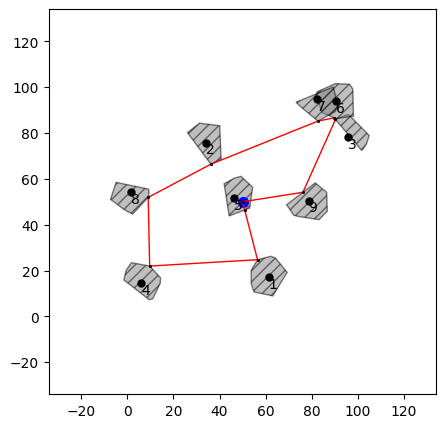

In [13]:
fig

##### 1.2 Metaheurisitic - Genetic Algorithm

In [5]:
cetsp = geoVeRoPyPri.solveCETSP(
    startLoc = depotLoc,
    endLoc = depotLoc,
    nodes = nodes,
    neighbor = "Circle",
    algo = "Metaheuristic",
    method = "GA",
    popSize = 10,
    neighRatio = {
        'crossover': 0.6,
        'swap': 0.05,
        'exchange': 0.05,
        'rotate': 0.05
    },
    stop = {
        'runtime': 100,
        'numIter': 300
    })

2 3 10


KeyError: 0

In [12]:
cetsp

{'ofv': 194.38328084959818,
 'seq': [0, 1, 5, 3, 7, 2, 4],
 'chromo': <geoVeRoPyPri.cetsp._solveCETSPGACircle.<locals>.chromosomeCETSP at 0x21399ecfc10>,
 'path': [(50, 50),
  (42.76006622129344, 62.25749028876739),
  (20.09099981964622, 65.29392486217041),
  (14.858293118321923, 31.42118410475124),
  (90.79085517598507, 50.94673827283836),
  (78.13121111509665, 43.80022386099771),
  (56.59047799543018, 44.62502138111877),
  (50, 50)],
 'runtime': <function geoVeRoPyPri.common.runtime(key1, key2=None, key3=None)>,
 'convergence': [{'bestOfv': 194.38328084959818,
   'bestChromo': <geoVeRoPyPri.cetsp._solveCETSPGACircle.<locals>.chromosomeCETSP at 0x21399ecfc10>,
   'bestSeq': [0, 1, 5, 3, 7, 2, 4]},
  {'bestOfv': 194.38328084959818,
   'bestChromo': <geoVeRoPyPri.cetsp._solveCETSPGACircle.<locals>.chromosomeCETSP at 0x21399ecfc10>,
   'bestSeq': [0, 1, 5, 3, 7, 2, 4]},
  {'bestOfv': 194.38328084959818,
   'bestChromo': <geoVeRoPyPri.cetsp._solveCETSPGACircle.<locals>.chromosomeCETSP at 

In [49]:
cetsp['chromo'].seq

[{key: 0, value: 0, prev: 6, next: 4} , {key: 4, value: 4, prev: 0, next: 9} , {key: 9, value: 9, prev: 4, next: 1} , {key: 1, value: 1, prev: 9, next: 8} , {key: 8, value: 8, prev: 1, next: 5} , {key: 5, value: 5, prev: 8, next: 2} , {key: 2, value: 2, prev: 5, next: 3} , {key: 3, value: 3, prev: 2, next: 6} , {key: 6, value: 6, prev: 3, next: 0} ]

In [10]:
fig, ax = geoVeRoPy.plotLocSeq(
    fig = fig,
    ax = ax,
    lineColor = 'brown',
    locSeq = cetsp['path'])

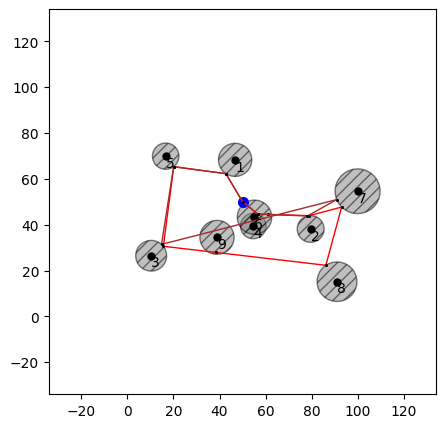

In [11]:
fig

#### 2.1 Disk-shape neighborhoods

Create the road map of Xiamen, Fujian, China

In [14]:
XiamenRoads = geoVeRoPy.loadDictionary("../data/Xiamen")

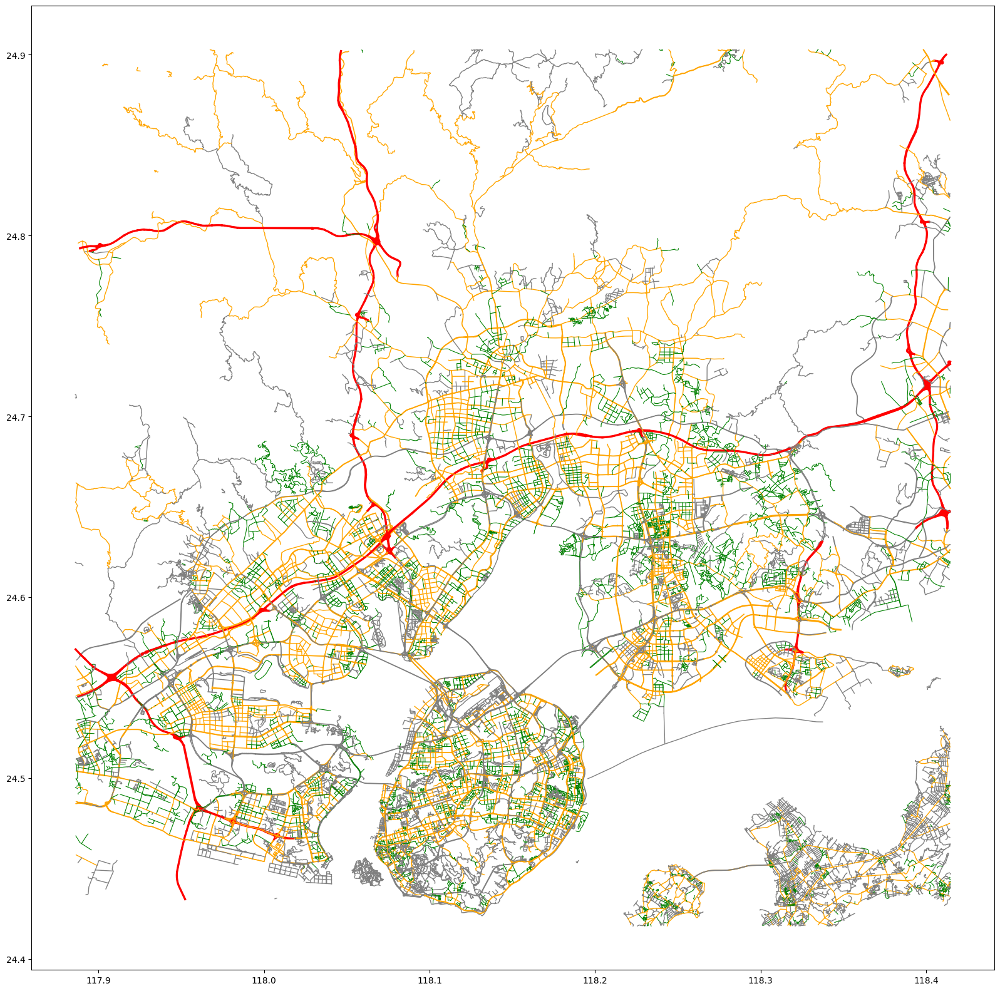

In [15]:
fig, ax = geoVeRoPy.plotRoads(
    roads = XiamenRoads['road'],
    figSize = (None, 20))

In [16]:
# nodes = geoVeRoPy.rndNodes(
#     nodeIDs = [i for i in range(1, 11)],
#     distr = 'RoadNetworkPolyLatLon',
#     polyLatLon = XiamenRoads['boundary'],
#     roads = XiamenRoads['road'],
#     roadClass = ['motorway', 'motorway_link'])

In [17]:
nodes = geoVeRoPy.rndNodes(
    nodeIDs = [i for i in range(1, 11)],
    distr = 'UniformPolyXY',
    polyXY = XiamenRoads['boundary'])

In [18]:
for n in nodes:
    nodes[n]['radiusMeter'] = 3000
#     nodes[n]['neiShape'] = "Circle"

In [19]:
fig, ax = geoVeRoPy.plotNodes(
    fig = fig,
    ax = ax,
    nodes = nodes,
    nodeColor = 'black',
    nodeMarkerSize = 6,
    latLonFlag = True)

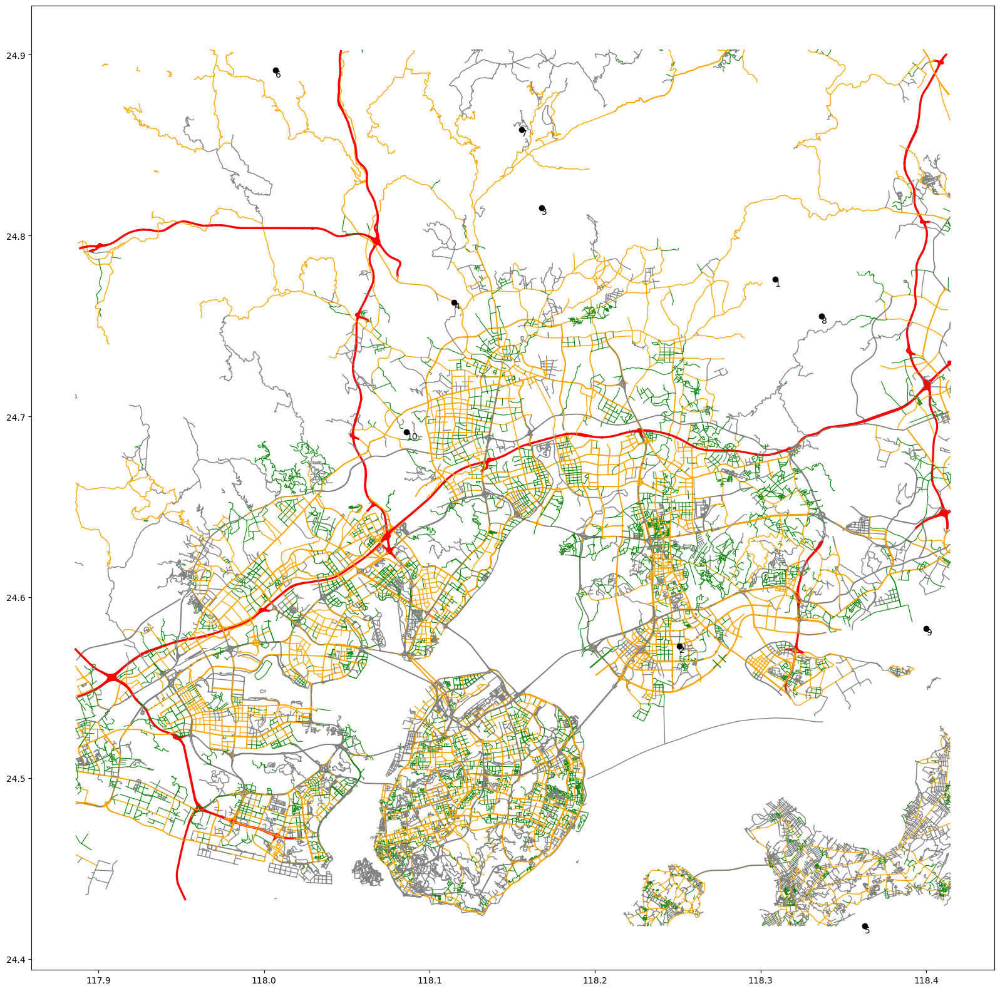

In [20]:
fig

In [21]:
cetsp = geoVeRoPyPri.solveCETSP(
    startLoc = (24.5, 118.15),
    endLoc = (24.5, 118.15),
    nodes = nodes,
    neighbor = "CircleLatLon",
    algo = "Exact",
    method = "GBD")

D:\Zoo/Gull/geoVeRoPy_Private\geoVeRoPyPri\cetsp.py:85: UserWarning: WARNING: Missing Benders' cut setting, set to be default ['paretoCut', 'degenCut']
  warnings.warn("WARNING: Missing Benders' cut setting, set to be default ['paretoCut', 'degenCut']")




[0, 10, 4, 6, 3, 7, 2, 8, 1, 9, 5, 11]
---------------------------------------------------------------------------
Residual: 202.63066880117452
Add default cut: - theta >= 25.558 * e[0, 10] + 55.092 * e[10, 4] + 27.087 * e[4, 6] + 3.231 * e[6, 3] + 0.0 * e[3, 7] + 9.061 * e[7, 2] + 16.429 * e[2, 8] + 0.103 * e[8, 1] + 26.275 * e[1, 9] + 32.877 * e[9, 5] + 6.918 * e[5, 11]
Time Pass: 0.01[s]
Cut: subtour - 14, gbc - 1, degen - 0
So far Best Dist: inf
CurrSol Dist: 1740.0047460737865
CurrObj: 1537.3740772726117
CurrBound: 1097.0561306073512


[0, 10, 4, 6, 3, 7, 2, 8, 1, 9, 5, 11]
---------------------------------------------------------------------------
Duplicated repSeq: [0, 10, 4, 6, 3, 7, 2, 8, 1, 9, 5, 11]


[0, 2, 10, 4, 6, 7, 3, 1, 8, 9, 5, 11]
---------------------------------------------------------------------------
Residual: 354.782502246697
Add Pareto cut: - theta >= 9.868 * e[0, 2] + 34.068 * e[2, 10] + 28.892 * e[10, 4] + 37.668 * e[4, 6] + 31.507 * e[6, 7] + 3.493 * e[7

Residual: 292.8044811957685
Add Pareto cut: - theta >= 10.643 * e[0, 2] + 12.569 * e[2, 5] + 28.313 * e[5, 9] + 49.241 * e[9, 8] + 24.578 * e[8, 1] + 53.033 * e[1, 3] + 15.017 * e[3, 4] + 12.322 * e[4, 7] + 17.439 * e[7, 6] + 3.636 * e[6, 10] + 66.013 * e[10, 11]
Time Pass: 0.22[s]
Cut: subtour - 29, gbc - 20, degen - 0
So far Best Dist: 1503.9805860271622
CurrSol Dist: 1548.207621199237
CurrObj: 1503.866192397231
CurrBound: 1383.834293757102


[0, 10, 6, 4, 7, 3, 8, 1, 9, 5, 2, 11]
---------------------------------------------------------------------------
Residual: 224.72227818614164
Add Pareto cut: - theta >= 65.941 * e[0, 10] + 1.085 * e[10, 6] + 8.37 * e[6, 4] + 12.212 * e[4, 7] + 49.509 * e[7, 3] + 9.18 * e[3, 8] + 0.0 * e[8, 1] + 26.999 * e[1, 9] + 28.213 * e[9, 5] + 12.572 * e[5, 2] + 10.642 * e[2, 11]
Time Pass: 0.24[s]
Cut: subtour - 29, gbc - 21, degen - 0
So far Best Dist: 1503.9805860271622
CurrSol Dist: 1559.4561781167076
CurrObj: 1459.3355729856094
CurrBound: 1383.834293

Residual: 296.61884157457536
Add Pareto cut: - theta >= 66.019 * e[0, 10] + 3.566 * e[10, 6] + 19.299 * e[6, 7] + 34.515 * e[7, 3] + 19.652 * e[3, 4] + 29.738 * e[4, 1] + 22.891 * e[1, 8] + 49.418 * e[8, 9] + 28.308 * e[9, 5] + 12.571 * e[5, 2] + 10.642 * e[2, 11]
Time Pass: 0.44[s]
Cut: subtour - 29, gbc - 36, degen - 1
So far Best Dist: 1503.9805860271622
CurrSol Dist: 1544.9513841861835
CurrObj: 1481.9414968069186
CurrBound: 1404.6427269584337


[0, 2, 5, 9, 1, 8, 3, 4, 7, 6, 10, 11]
---------------------------------------------------------------------------
Residual: 222.8234104499594
Add Pareto cut: - theta >= 10.642 * e[0, 2] + 12.573 * e[2, 5] + 28.214 * e[5, 9] + 26.997 * e[9, 1] + 0.0 * e[1, 8] + 29.902 * e[8, 3] + 15.078 * e[3, 4] + 12.326 * e[4, 7] + 17.442 * e[7, 6] + 3.637 * e[6, 10] + 66.013 * e[10, 11]
Time Pass: 0.46[s]
Cut: subtour - 29, gbc - 37, degen - 1
So far Best Dist: 1503.9805860271622
CurrSol Dist: 1550.7284048788724
CurrObj: 1493.8579469003805
CurrBound: 1404

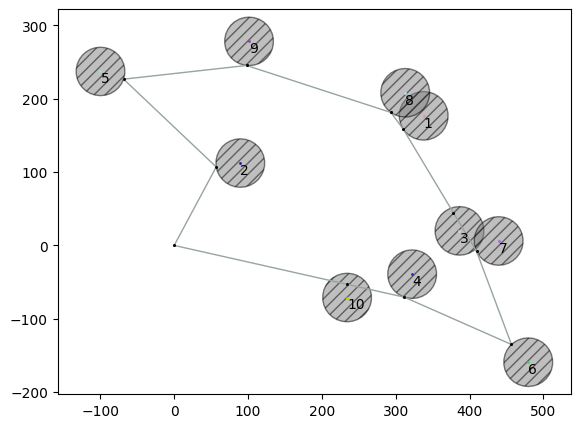

In [22]:
fig1, ax1 = geoVeRoPy.plotNodes(cetsp['nodesMercator'])
fig1, ax1 = geoVeRoPy.plotLocSeq(
    fig = fig1,
    ax = ax1,
    locSeq = cetsp['cetspMercator']['path'])
# fig1

In [23]:
cetsp

{'ofv': 136682.32773028323,
 'dist': 136682.32773028323,
 'path': [(24.500000000000004, 118.15),
  (24.690992973161613, 118.10244245014502),
  (24.75469303916929, 118.08656364031559),
  (24.87287834901085, 118.02868273113491),
  (24.834368125607664, 118.14259334669367),
  (24.808591862994543, 118.19026864266455),
  (24.753421163521402, 118.29227948668145),
  (24.739681179959064, 118.31285027271825),
  (24.58010020685035, 118.37036595506662),
  (24.443959130852203, 118.3536086997395),
  (24.546521118247842, 118.24613600034407),
  (24.500000000000004, 118.15)],
 'runtime': 0.5539360046386719,
 'nodesMercator': {1: {'loc': [337.929057391691, 176.68992717470974],
   'neiShape': 'Circle',
   'radius': 33.11364093421377,
   'neighbor': [(337.929057391691, 209.8035681089235),
    (344.8137704674556, 209.07995560607168),
    (351.39758854529055, 206.94074343616882),
    (357.39276718253024, 203.4794254361186),
    (362.5372883046684, 198.84727781176971),
    (366.6063116525164, 193.24674764181

In [24]:
fig, ax = geoVeRoPy.plotLocSeq(
    fig = fig,
    ax = ax,
    locSeq = cetsp['path'],
    arrowFlag = False,
    lineColor = 'red',
    lineWidth = 2,
    latLonFlag = True)

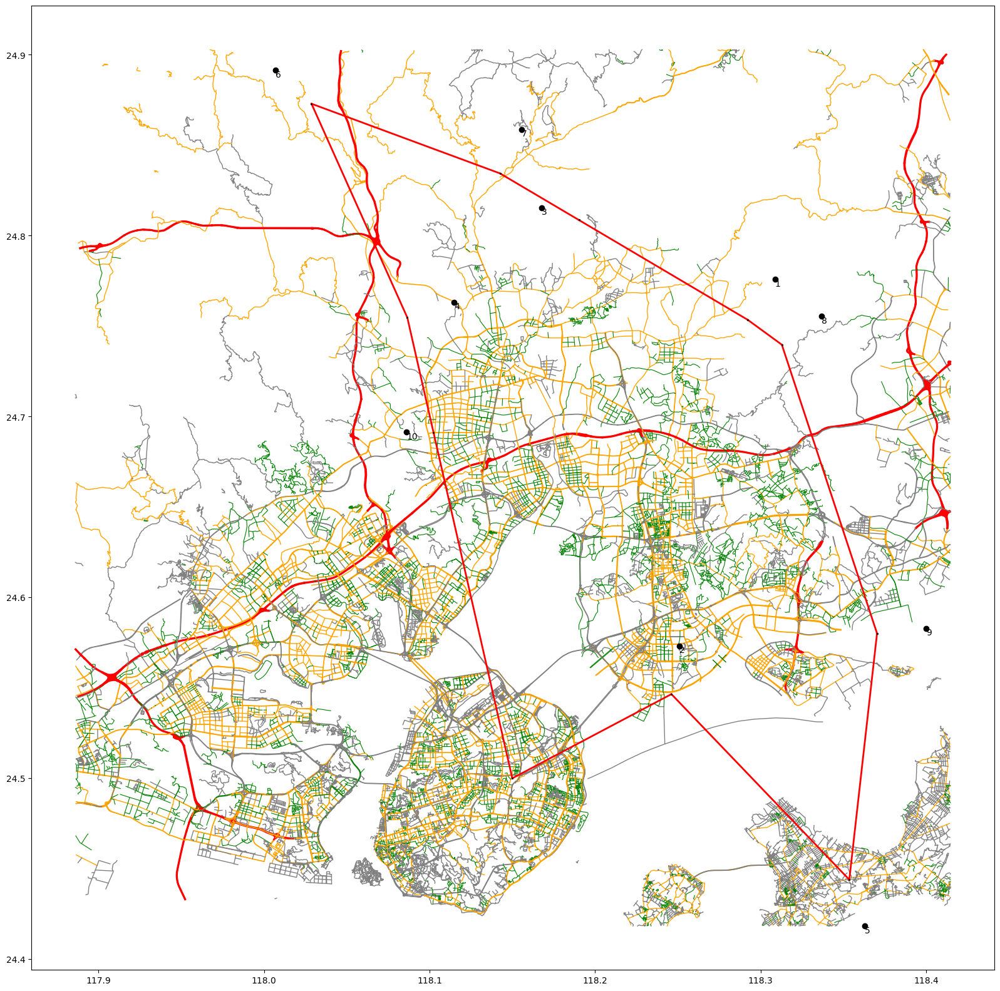

In [25]:
fig

In [32]:
for i in nodes:
    polyLatLon = geoVeRoPy.circleByCenterLatLon(
        center = nodes[i]['loc'],
        radius = 3000)
    fig, ax = geoVeRoPy.plotPoly(
        fig = fig,
        ax = ax,
        poly = polyLatLon,
        edgeColor = 'blue',
        edgeWidth = 1,
        fillStyle = '///',
        opacity = 0.1,
        latLonFlag = True)

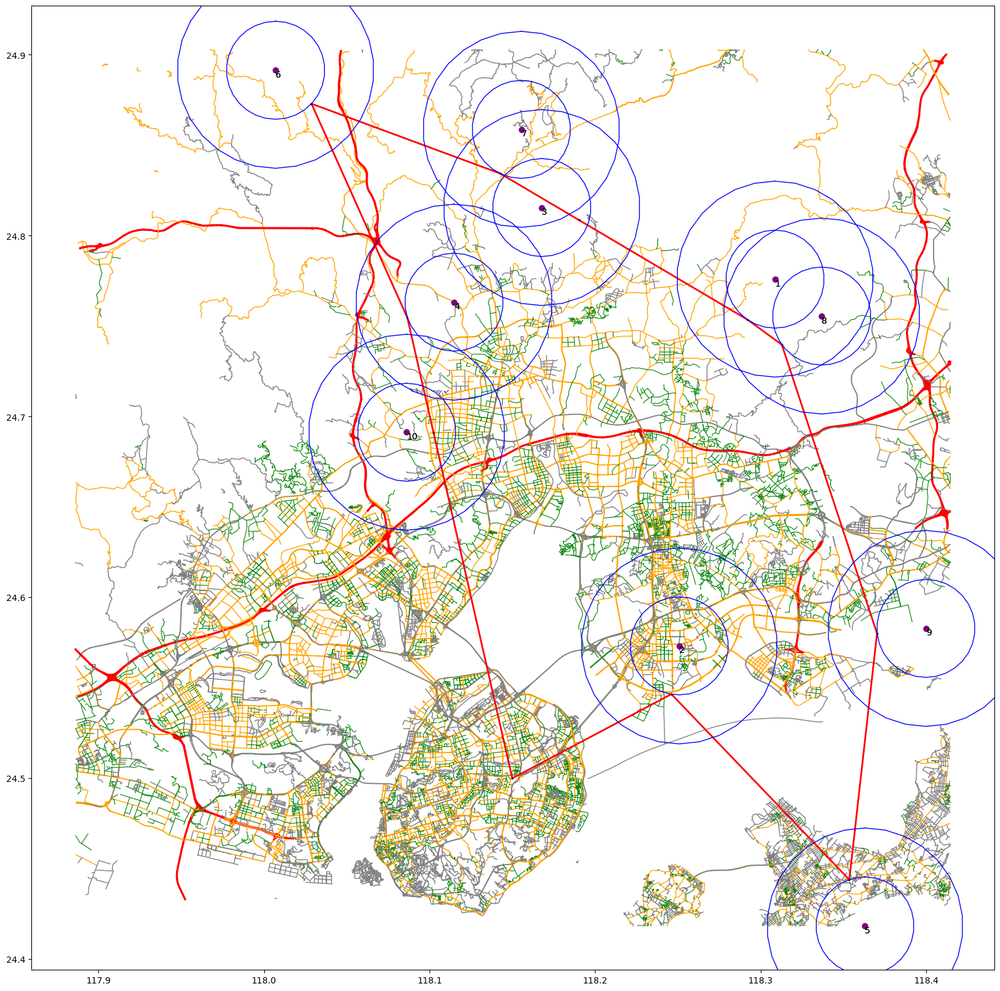

In [33]:
fig

In [28]:
fig, ax = geoVeRoPy.plotNodes(
    fig = fig,
    ax = ax,
    nodes = cetsp['nodesRev'],
    nodeColor = 'purple',
    nodeMarkerSize = 6,
    latLonFlag = True)

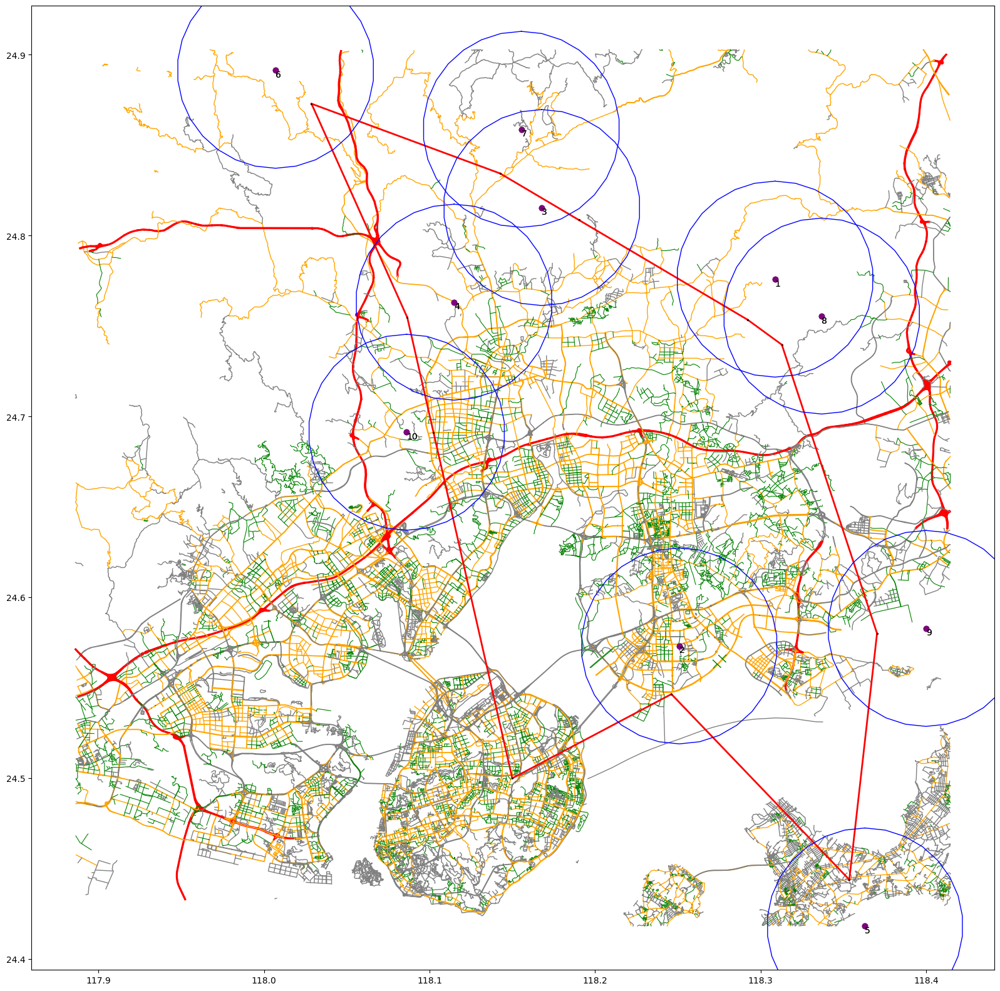

In [29]:
fig

In [30]:
cetsp['nodesRev']

{1: {'loc': (24.77592975681934, 118.30872326213102)},
 2: {'loc': (24.573187256490748, 118.25087190516399)},
 3: {'loc': (24.815491695102203, 118.16782016567242)},
 4: {'loc': (24.763201635246865, 118.1147926908595)},
 5: {'loc': (24.418366793695572, 118.36308165091386)},
 6: {'loc': (24.8913794174212, 118.00699020177078)},
 7: {'loc': (24.85872551145803, 118.1554592817364)},
 8: {'loc': (24.755520512234902, 118.33694121979777)},
 9: {'loc': (24.582863758086184, 118.39991104970728)},
 10: {'loc': (24.69128257677725, 118.08619682696542)}}

In [31]:
nodes

{1: {'loc': (24.775929756819345, 118.30872326213102), 'radiusMeter': 3000},
 2: {'loc': (24.573187256490744, 118.25087190516398), 'radiusMeter': 3000},
 3: {'loc': (24.81549169510221, 118.16782016567242), 'radiusMeter': 3000},
 4: {'loc': (24.763201635246855, 118.1147926908595), 'radiusMeter': 3000},
 5: {'loc': (24.41836679369558, 118.36308165091387), 'radiusMeter': 3000},
 6: {'loc': (24.89137941742121, 118.00699020177078), 'radiusMeter': 3000},
 7: {'loc': (24.858725511458015, 118.15545928173638), 'radiusMeter': 3000},
 8: {'loc': (24.755520512234902, 118.33694121979777), 'radiusMeter': 3000},
 9: {'loc': (24.582863758086187, 118.39991104970727), 'radiusMeter': 3000},
 10: {'loc': (24.69128257677726, 118.08619682696542), 'radiusMeter': 3000}}